In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pylab as ply
from sklearn.model_selection import TimeSeriesSplit
from fbprophet import Prophet
%matplotlib inline

In [2]:
df_actual = pd.read_csv("../write_data/Dallas-Fort Worth.csv")
df_actual['time'] = pd.to_datetime(df_actual['time'])

In [3]:
df_fut = pd.read_csv("../write_data/Dallas-Fort Worth_future.csv")
df_fut['ds'] = pd.to_datetime(df_fut['ds'])

In [4]:
zippies = df_fut.Zip_code.unique()

In [5]:
all_zips = pd.read_csv("../write_data/zillow_housing_zipcodes.csv")
all_zips['Date_index'] = pd.to_datetime(all_zips['Date_index'])
all_zips = all_zips.set_index('Date_index')

In [6]:
zippies_strings = ["%.0f" % number for number in zippies]

In [7]:
metro_zips = all_zips.filter(items=zippies_strings)

In [8]:
actual_mean = metro_zips.mean(axis=1)

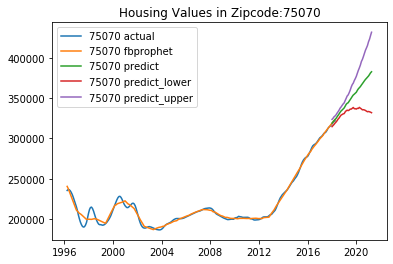

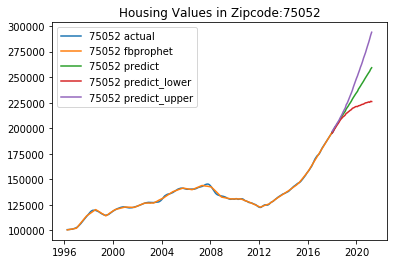

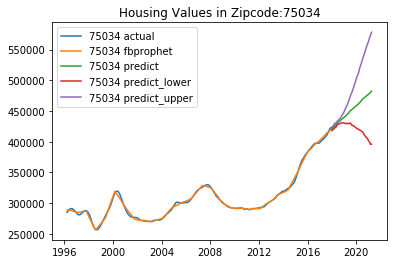

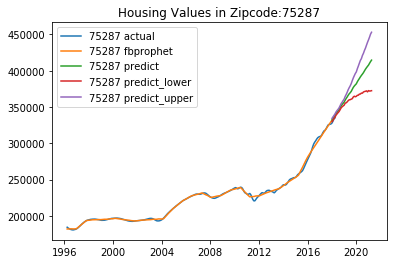

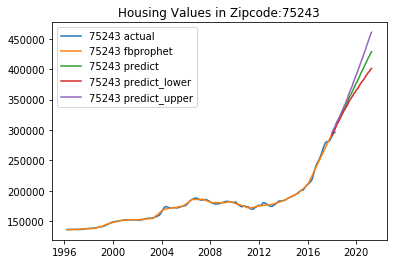

...

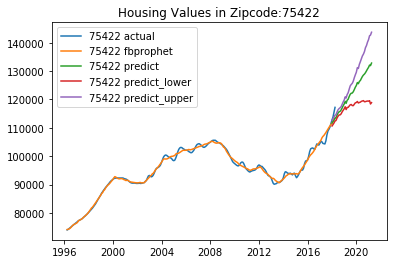

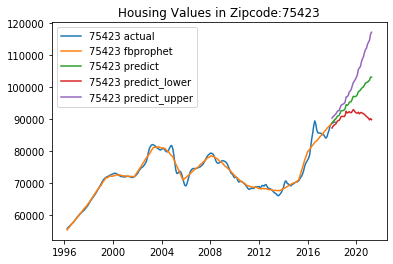

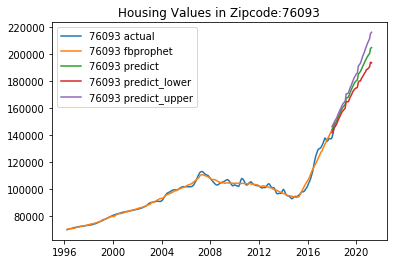

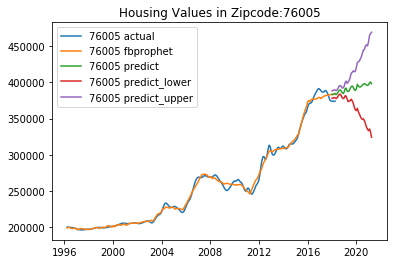

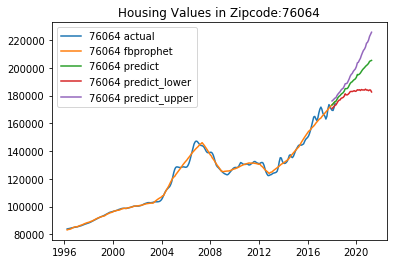

In [9]:
for zippy in zippies:
    
    plt.plot(df_actual[df_actual['Zip_code'] == zippy]['time'], 
             df_actual[df_actual['Zip_code'] == zippy]['value'], 
             label=f'{zippy} actual')

    plt.plot(df_actual[df_actual['Zip_code'] == zippy]['time'], 
             df_actual[df_actual['Zip_code'] == zippy]['yhat'], 
             label=f'{zippy} fbprophet')

    plt.plot(df_fut[df_fut['Zip_code'] == zippy]['ds'], 
             df_fut[df_fut['Zip_code'] == zippy]['yhat'], 
             label=f'{zippy} predict')

    plt.plot(df_fut[df_fut['Zip_code'] == zippy]['ds'], 
             df_fut[df_fut['Zip_code'] == zippy]['yhat_lower'], 
             label=f'{zippy} predict_lower')

    plt.plot(df_fut[df_fut['Zip_code'] == zippy]['ds'], 
             df_fut[df_fut['Zip_code'] == zippy]['yhat_upper'], 
             label=f'{zippy} predict_upper')
    
    plt.legend(loc='best')
    plt.title(f"Housing Values in Zipcode:{zippy}")
    
    plt.show()

In [10]:
metro_annual = metro_zips.resample("YS").mean()
metro_annual_pct = metro_annual.pct_change()
metro_annual_pct_diff = metro_annual.pct_change().diff()

In [11]:
metro_annual_pct.min().min(), metro_annual_pct.max().max()

(-0.19304005252790546, 0.31496736920937196)

In [12]:
metro_annual_pct.tail(3).T.sort_values('2018-01-01', ascending=False)

Date_index,2016-01-01,2017-01-01,2018-01-01
76114,0.105836,0.245126,0.194534
76103,0.122233,0.184496,0.165376
75210,0.101118,0.094615,0.152409
75241,0.126959,0.314967,0.150354
75141,0.260114,0.163384,0.149158
...,...,...,...
75206,0.127257,0.144845,0.010476
75093,0.073353,0.043436,0.006512
75039,0.037500,0.024066,0.003413
75254,0.062732,0.159892,-0.015774


In [13]:
metro_annual_pct_diff.min().min(), metro_annual_pct_diff.max().max()

(-0.23751933145413262, 0.2985973993897555)

In [14]:
df_pred_wide = df_actual.pivot(index='time', columns='Zip_code',values='yhat')
df_fut_wide = df_fut.pivot(index='ds', columns='Zip_code',values='yhat')

In [15]:
fbproph = pd.concat([df_pred_wide.resample("YS").mean(), df_fut_wide.resample("YS").mean()], axis=0)
fb_pct_change = fbproph.pct_change()
fb_ann = fbproph.pct_change().diff()

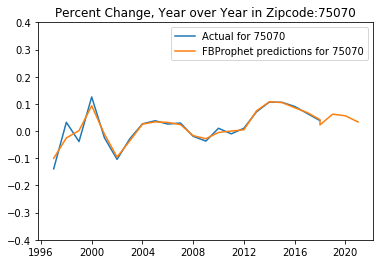

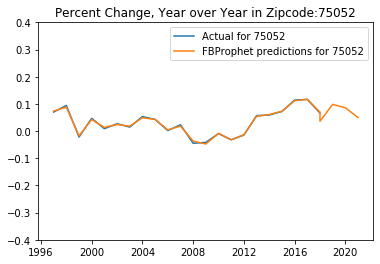

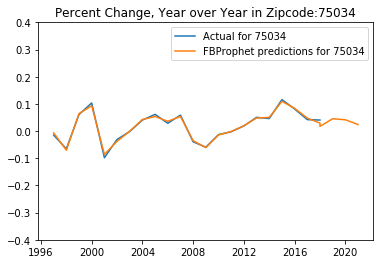

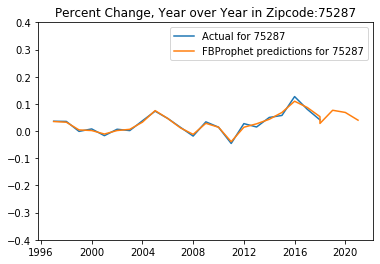

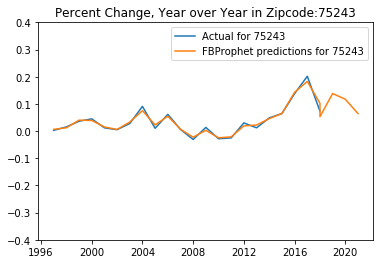

...

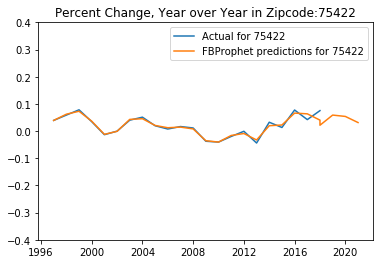

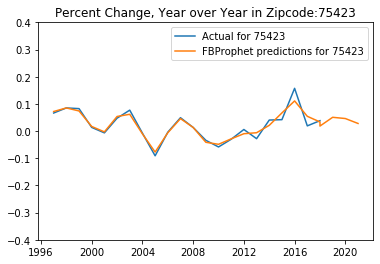

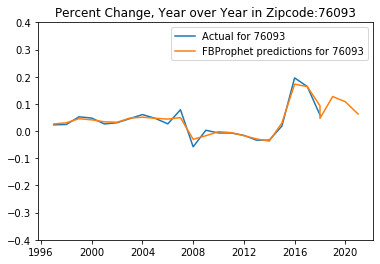

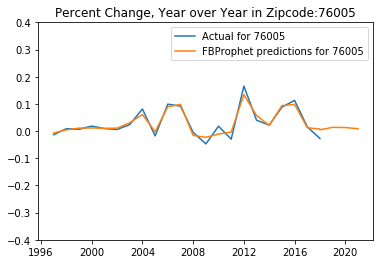

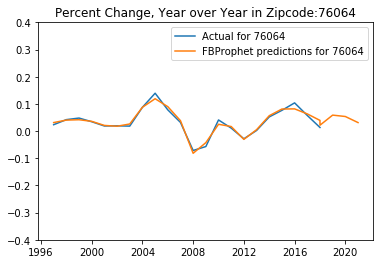

In [16]:
for zippy in zippies:
    
    plt.plot(metro_annual_pct.index, 
         metro_annual_pct[str(zippy)], 
         label=f'Actual for {zippy}')
    
    plt.plot(fb_pct_change.index, 
             fb_pct_change[zippy], 
             label=f'FBProphet predictions for {zippy}')

    plt.ylim(-0.4,0.4)
    plt.legend(loc='best')
    plt.title(f"Percent Change, Year over Year in Zipcode:{zippy}")
    
    plt.show()

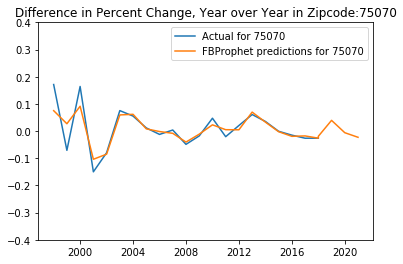

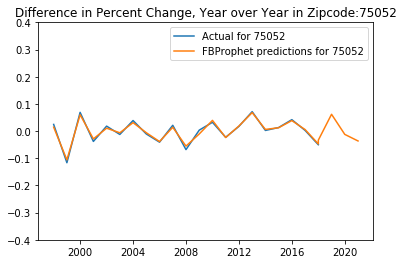

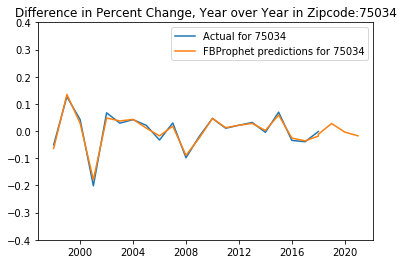

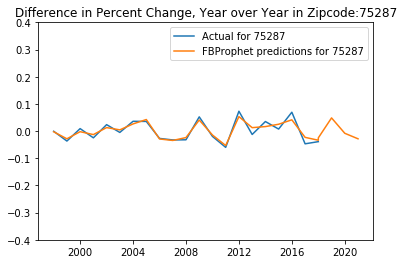

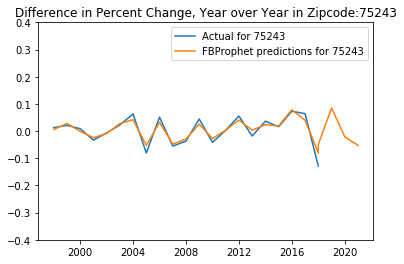

...

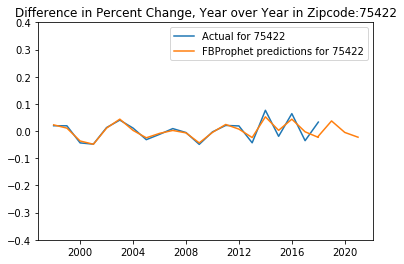

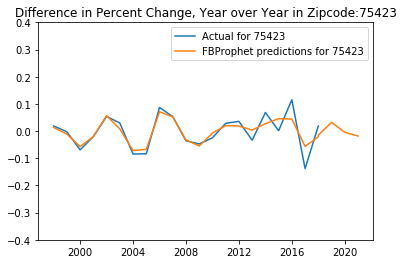

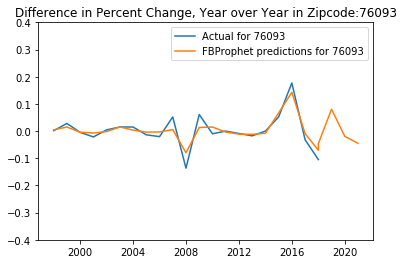

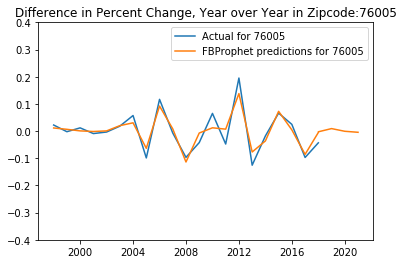

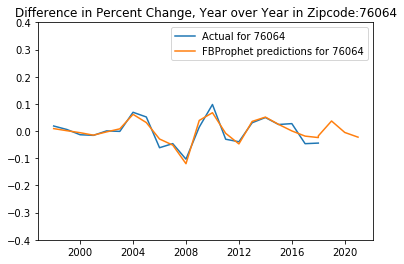

In [17]:
for zippy in zippies:
    
    plt.plot(metro_annual_pct_diff.index, 
         metro_annual_pct_diff[str(zippy)], 
         label=f'Actual for {zippy}')
    
    plt.plot(fb_ann.index, 
             fb_ann[zippy], 
             label=f'FBProphet predictions for {zippy}')

    plt.ylim(-0.4,0.4)
    plt.legend(loc='best')
    plt.title(f"Difference in Percent Change, Year over Year in Zipcode:{zippy}")
    
    plt.show()

In [18]:
metro_annual_pct_diff.tail(3).T.sort_values('2018-01-01', ascending=False)

Date_index,2016-01-01,2017-01-01,2018-01-01
75210,0.113376,-0.006503,0.057794
76050,0.124854,-0.089054,0.055725
75402,0.096330,-0.079435,0.046447
75422,0.064250,-0.035264,0.033023
75182,0.098014,-0.103477,0.024223
...,...,...,...
75254,-0.002585,0.097160,-0.175666
75224,0.155319,0.094172,-0.178180
75232,0.125703,0.046744,-0.180214
75233,0.065881,0.159218,-0.190995
